# Advanced-Lane-Lines Project

## Init

In [1]:
import os, sys
import numpy as np
import cv2
import pickle
import glob
import random
from collections import deque
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# pretty formatting of np float arrays
float_formatter = lambda x: "%10.4f" % x
np.set_printoptions(formatter={'float_kind' : float_formatter})


#############################################################################
# Constants and variables
#############################################################################

# Turns debugging images on
image_output= True 

# Plot size for plotting images with matplotlib in inches
plot_size = (12, 12)

# amount of corners on chessboard pattern
nx, ny = 9, 6
cam_calib_file = "cam_calib_params.p"

# list of calibration images
calib_files = glob.glob("./camera_cal/calibration*.jpg")
test_files  = glob.glob("./test_images/*.jpg")

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.48 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255


## Helper functions
Some of them have been used during *P2 - Finding lane*.

In [2]:
def ransac_polyfit(x, y, order=3, n=10, k=100, t=0.1, d=100, f=0.8):
    # Thanks https://en.wikipedia.org/wiki/Random_sample_consensus
    # n – minimum number of data points required to fit the model
    # k – maximum number of iterations allowed in the algorithm
    # t – threshold value to determine when a data point fits a model
    # d – number of close data points required to assert that a model fits well to data
    # f – fraction of close data points required

    besterr = np.inf
    bestfit = []
    for kk in range(k):
        maybeinliers = random.sample(range(len(x)), int(n)) #np.random.randint(x.size, size=n)
        maybemodel = np.polyfit(x[maybeinliers], y[maybeinliers], order)
        print("maybemodel: ",maybemodel)
        alsoinliers = np.abs(np.polyval(maybemodel, x)-y) < t
        if sum(alsoinliers) > d and sum(alsoinliers) > len(x)*f:
            bettermodel = np.polyfit(x[alsoinliers], y[alsoinliers], order)
            print("bettermodel: ", bettermodel)
            thiserr = np.sum(np.abs(np.polyval(bettermodel, x[alsoinliers])-y[alsoinliers]))
            if thiserr < besterr:
                bestfit = bettermodel
                besterr = thiserr

    print("run ransac for %d iterations" % kk)
    return bestfit


class RingBuffer():
    "A 1D ring buffer using numpy arrays"
    def __init__(self, length):
        self.data = np.zeros(length, dtype='f')
        self.index = 0

    def extend(self, x):
        "adds array x to ring buffer"
        x_index = (self.index + np.arange(x.size)) % self.data.size
        self.data[x_index] = x
        self.index = x_index[-1] + 1

    def get(self):
        "Returns the first-in-first-out data in the ring buffer"
        idx = (self.index + np.arange(self.data.size)) %self.data.size
        return self.data[idx]


def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)


def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)


def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    return cv2.bitwise_and(img, mask)


def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

            
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img


# Python 3 has support for cool math symbols.
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def filter_and_extrapolate_lines(lines, image, slope_threshold_low = 0.5, slope_threshold_high = 0.8, verbose=False):
    """
    Filter out lines and assign lines to the left or right lane group according to their slope.
    The line equation is: y = m*x + b
    When we detect a line with a positive slope and a value greater than the pos_threshold
    it gets assigned to the left group, if the slope is negative and smaller than the negative
    threshold it gets assigned to the right group.
    
    At the end we do a linear regression line fitting for both the left and right lane lines.
    """

    if len(lines) == 0:
        print("No lines in array!")
        return []

    if verbose: 
        print("Extracting lane from %d lines" % len(lines))
    
    lane_lines  = []
    left_idx    = []
    right_idx   = []
    outlier_cnt = 0
    
    minimum_y = image.shape[0] 
    maximum_y = image.shape[0]

    # filter out lines and assign them to the left or right lane group
    for i, line in enumerate(lines):
        for x1,y1,x2,y2 in line:
            deltX = x2-x1
            deltY = y2-y1
            slope = deltY / deltX
            length = np.sqrt(deltX**2 + deltY**2)
            # TODO: use also length as criterion for line selection...

            # if positive slope, assign to right lane group
            if (slope > slope_threshold_low and slope < slope_threshold_high): 
                if verbose: print("\tFound left lane line with slope=%.2f and length=%.2f" % (slope, length)) 
                right_idx.append(i)

            # if negative slope, assign to left lane group
            elif (slope < -slope_threshold_low and slope > -slope_threshold_high): 
                if verbose: print("\tFound right lane line with slope=%.2f and length=%.2f" % (slope, length))
                left_idx.append(i)

            # this must be an outlier
            else:
                if verbose: print("\tFound outlier line with slope=%.2f and length=%.2f" % (slope, length))
                outlier_cnt+=1

            # update the min y (horizon)
            minimum_y = min(min(y1, y2), minimum_y)

    if verbose:
        print("Result: %d left, %d right and %d outlier detected" % (len(left_idx), len(right_idx), outlier_cnt))

    if len(right_idx) == 0 or len(left_idx) == 0:
        print("Couldn't detect both road lanes in the list of lines, %d left and %d right :(" % \
             (len(left_idx), len(right_idx)))
        return []

    # pick out xs and ys from lines array
    left_xs  = np.array(lines[left_idx][:, :, 0:3:2]).flatten()
    left_ys  = np.array(lines[left_idx][:, :, 1:4:2]).flatten()
    right_xs = np.array(lines[right_idx][:, :, 0:3:2]).flatten()
    right_ys = np.array(lines[right_idx][:, :, 1:4:2]).flatten()
    
    # run linear regression for line fitting over collected points for both left and right lane
    left_slope,  left_intercept  = np.polyfit(left_xs,  left_ys, 1)
    #ransac_polyfit(left_xs, left_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    right_slope, right_intercept = np.polyfit(right_xs, right_ys, 1)
    #ransac_polyfit(right_xs, right_ys, order=1, n=left_xs.size//2, k=left_xs.size//2, d=left_xs.size//2, t=0.4)
    # def ransac_polyfit(x, y, order=3, n=20, k=100, t=0.1, d=100, f=0.8)
    
    # calculate pixel coordinates to describe the left and right lane line
    left_x1  = int((minimum_y - left_intercept)  / left_slope)
    left_x2  = int((maximum_y - left_intercept)  / left_slope)
    right_x1 = int((minimum_y - right_intercept) / right_slope)
    right_x2 = int((maximum_y - right_intercept) / right_slope)

    # define the final found lines based on two points and return them
    lane_lines.append([[left_x1,  minimum_y, left_x2,  maximum_y]])
    lane_lines.append([[right_x1, minimum_y, right_x2, maximum_y]])

    return lane_lines


def get_straight_lines(image):
    # Canny edge detectiion parameters
    kernel_size = 3 # for gaussian blur before canny edge detection
    canny_low_threshold  = 100
    canny_high_threshold = 200

    # Parameters for hough line extraction
    hough_rho = 1
    hough_theta = np.pi / 360
    hough_threshold = 20
    hough_min_line_len = 30
    hough_max_line_gap = 60

    # Slope threshold for line filtering and extrapolation
    slope_threshold_low  = 0.5
    slope_threshold_high = 0.8

    ysize, xsize = image.shape[0], image.shape[1]
    
    # Use S channel of HLS colourspace
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]

    # first smooth image to get better results during edge detection
    img = gaussian_blur(S, kernel_size)
    gray = canny(img, canny_low_threshold, canny_high_threshold)

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),
                          (xsize*dist_from_side,     ysize*roi_height),
                          (xsize*(1-dist_from_side), ysize*roi_height),
                          (xsize,                    ysize)
                         ]], dtype=np.int32)
    masked_img = region_of_interest(gray, vertices)
    
    # extracting straight lines from edges
    lines = cv2.HoughLinesP(masked_img, hough_rho, hough_theta, hough_threshold, np.array([]),
                            hough_min_line_len, hough_max_line_gap)

    lines2 = filter_and_extrapolate_lines(lines, undist, slope_threshold_low, slope_threshold_high, verbose=False)
    return lines2

## Camera calibration

In [3]:
def cam_calib(calib_files, corners=(9, 6)):
    # amount of corners on chessboard pattern
    nx, ny = corners
    # 3D points in real world space:
    objpoints = []
    # 2D points in image plane:
    imgpoints = []
    
    # Prepare object points like (0,0,0), ... (nx, ny, 0) for one chess calibration pattern
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:, 0:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    for file in calib_files:
        img = mpimg.imread(file)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == False:
            print("Couldn't detect (%d, %d) corners in image %s" % (nx, ny, file))
            continue

        # if corners are found add object points and image points
        imgpoints.append(corners)
        objpoints.append(objp)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    print("ret: ", ret)
    return mtx, dist


if not os.path.isfile(cam_calib_file):
    print("Can't find camera calibration file %s, do calibration from scratch!" % cam_calib_file)
    mtx, dist = cam_calib(calib_files, corners=(nx, ny))
    dist_pickle = {
        "mtx"  : mtx,
        "dist" : dist
    }
    pickle.dump( dist_pickle, open(cam_calib_file, "wb" ) )

else:
    # load camera calibration parameters from pickle file
    with open(cam_calib_file, mode='rb') as f:
        dist_pickle = pickle.load(f)
    print("Loaded camera calibration from file %s:" % cam_calib_file)

print("camera matrix:\n%s" % dist_pickle["mtx"])
print("distortion coefficients (k1, k2, p1, p2, k3):\n%s" % dist_pickle["dist"])

Loaded camera calibration from file cam_calib_params.p:
camera matrix:
[[ 1153.9609     0.0000   669.7054]
 [    0.0000  1148.0250   385.6562]
 [    0.0000     0.0000     1.0000]]
distortion coefficients (k1, k2, p1, p2, k3):
[[   -0.2410    -0.0531    -0.0012    -0.0001     0.0267]]


** Visualizing camera calibration **

Showing undistorted 5 random images from calibration dataset:


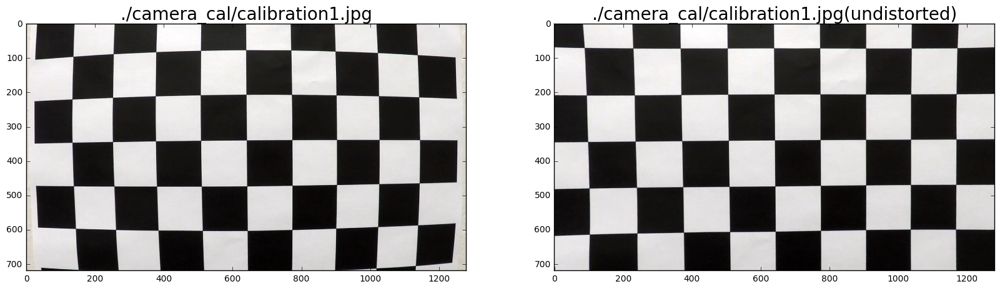

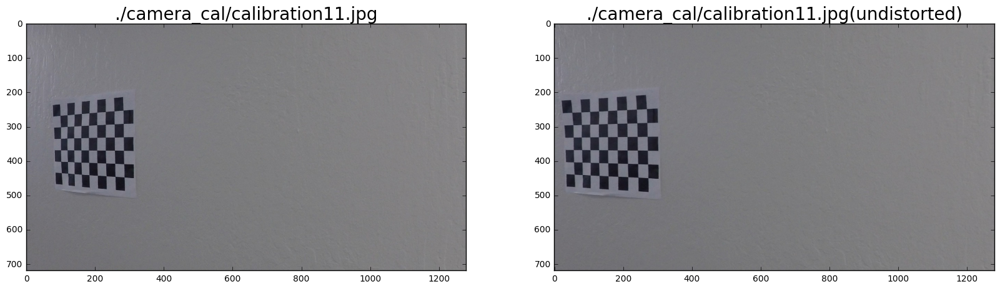

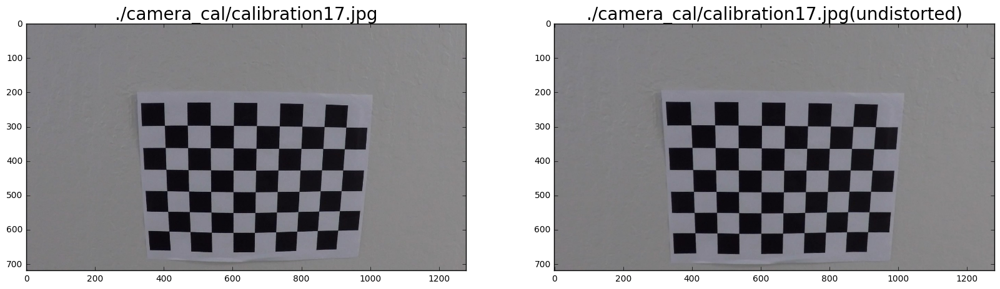

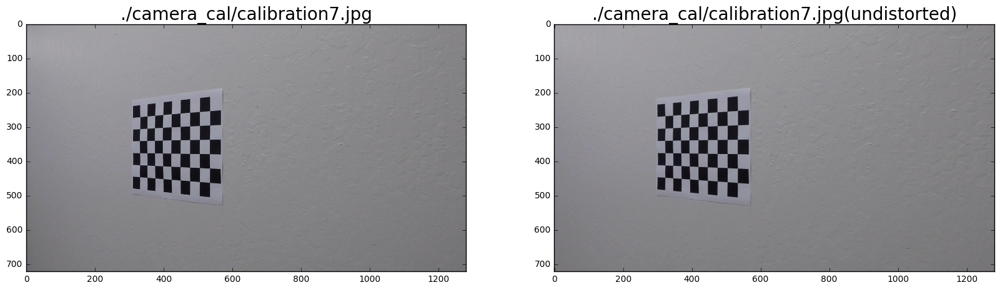

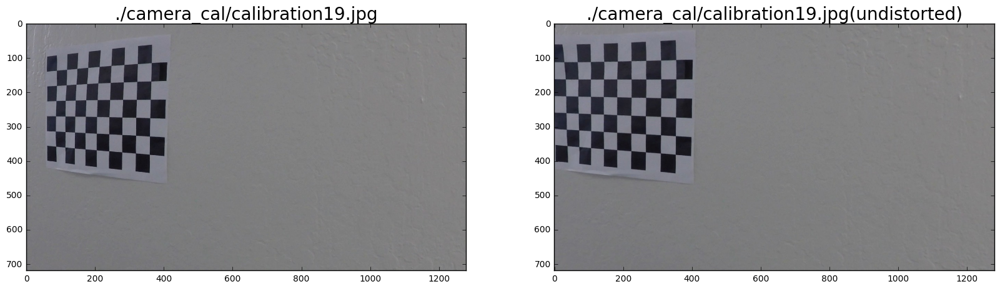

In [4]:
print("Showing undistorted 5 random images from calibration dataset:")
for file in random.sample(calib_files, 5):
    img = mpimg.imread(file)
    dst = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file, fontsize=20)
    ax2.imshow(dst)
    ax2.set_title(file + "(undistorted)", fontsize=20)

    plt.show()

## Regin of interest masking

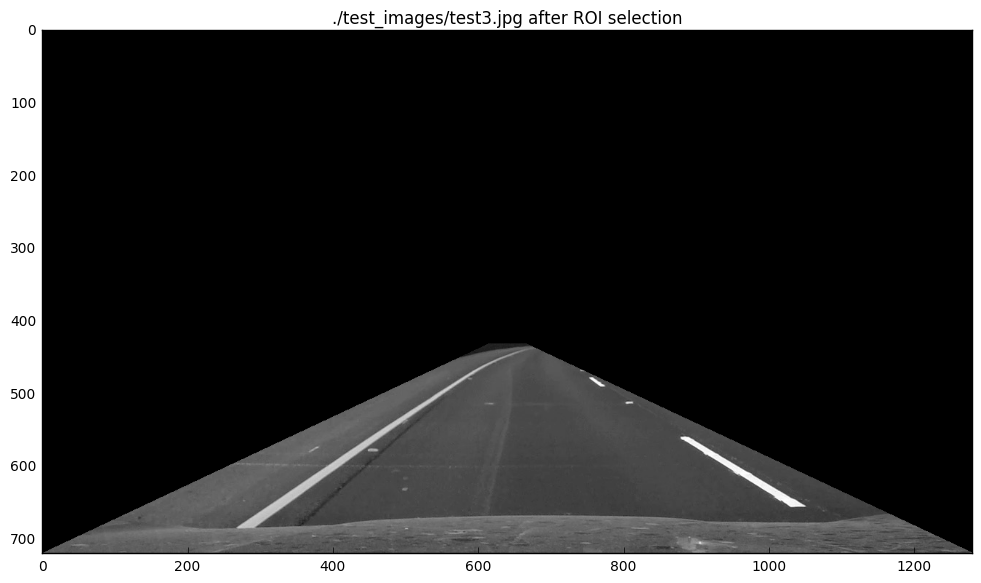

In [5]:
for file in random.sample(test_files, 1):
    img = mpimg.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    xsize, ysize = (img.shape[1], img.shape[0])

    # creating a region of interest (symmetric trapezoid) to only select interesting area in image
    vertices = np.array([[(0,                        ysize),   \
                          (xsize*dist_from_side,     ysize*roi_height), \
                          (xsize*(1-dist_from_side), ysize*roi_height), \
                          (xsize,                    ysize) \
                         ]], dtype=np.int32)

    masked_img = region_of_interest(gray, vertices)
    if image_output:
        fig = plt.figure(figsize=plot_size)
        plt.title(file + " after ROI selection")
        plt.imshow(masked_img, cmap='gray')
        plt.show()


## Using colourspaces

Use components of different colourspaces to be invariant against changes in colour and luminance, for example be invariant against road markings in different colours.

Using the *saturation* channel S in colourspace *HLS* has exactly this advantage, it is only describing the changes in saturation but very invariant against changes in luminance and hues / colours.
This channel is therefore used in edge detection.

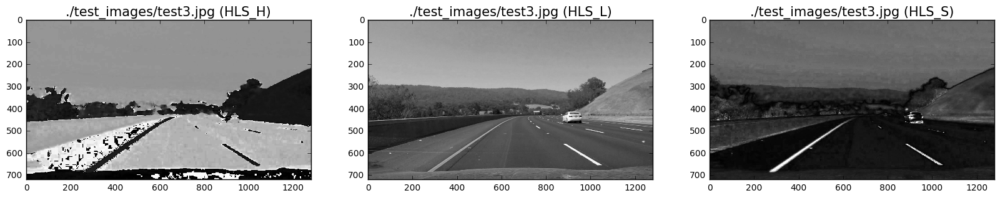

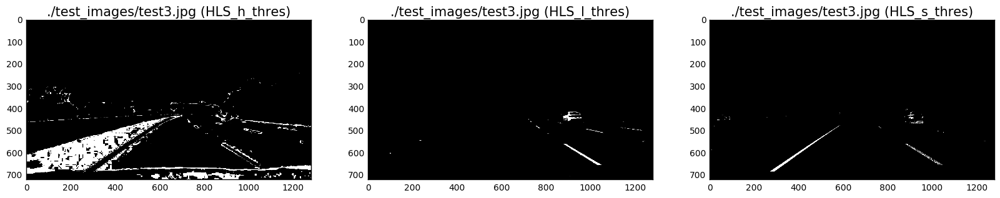

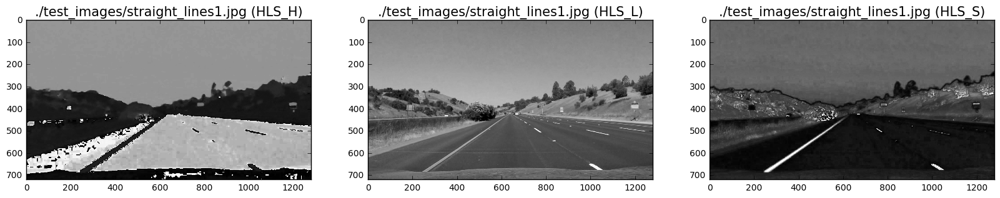

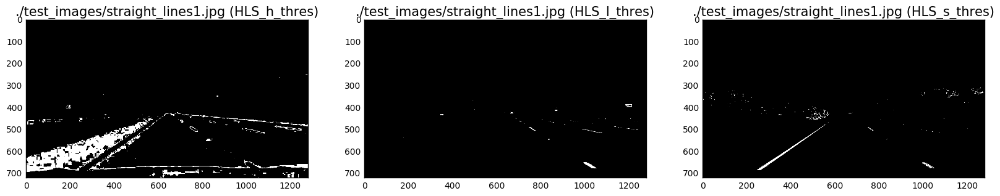

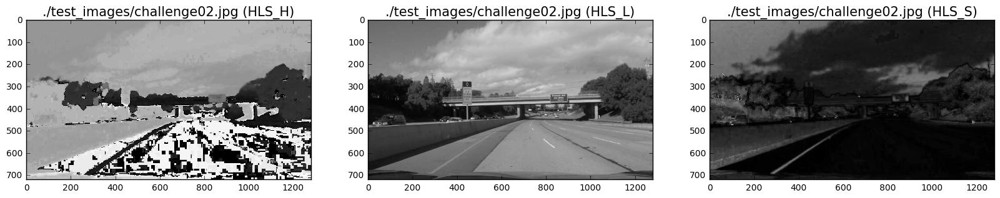

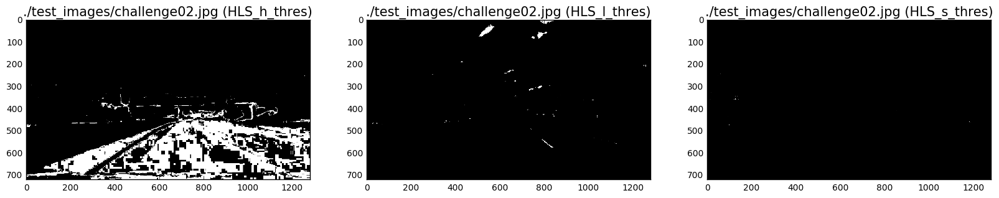

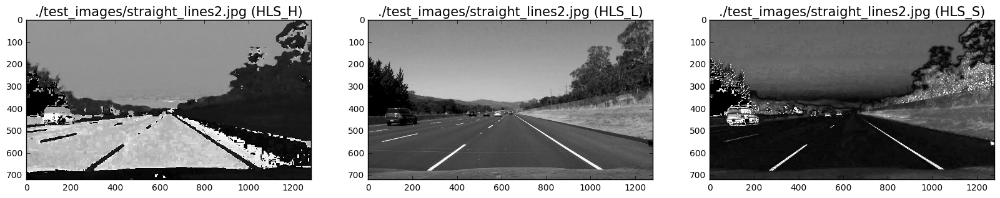

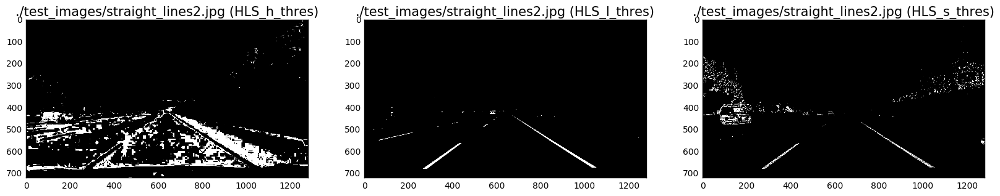

In [6]:
for file in random.sample(test_files, 4):
    img = mpimg.imread(file)
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0] / np.max(hls[:,:,0])
    L = hls[:,:,1] / np.max(hls[:,:,1])
    S = hls[:,:,2] / np.max(hls[:,:,2])

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(H, cmap='gray')
    ax1.set_title(file + " (HLS_H)", fontsize=15)
    ax2.imshow(L, cmap='gray')
    ax2.set_title(file + " (HLS_L)", fontsize=15)
    ax3.imshow(S, cmap='gray')
    ax3.set_title(file + " (HLS_S)", fontsize=15)
    plt.show()
    
    thresh = (0.8, 1.0)
    binary_h = np.zeros_like(S)
    binary_l = np.zeros_like(S)
    binary_s = np.zeros_like(S)
    binary_h[(H > thresh[0]) & (H <= thresh[1])] = 1
    binary_l[(L > thresh[0]) & (L <= thresh[1])] = 1
    binary_s[(S > thresh[0]) & (S <= thresh[1])] = 1

    # Visualize images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
    ax1.imshow(binary_h, cmap='gray')
    ax1.set_title(file + " (HLS_h_thres)", fontsize=15)
    ax2.imshow(binary_l, cmap='gray')
    ax2.set_title(file + " (HLS_l_thres)", fontsize=15)
    ax3.imshow(binary_s, cmap='gray')
    ax3.set_title(file + " (HLS_s_thres)", fontsize=15)
    plt.show()

## Edge detection pipeline

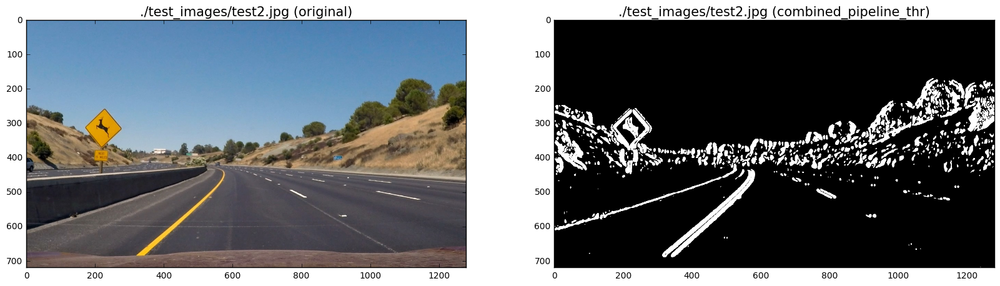

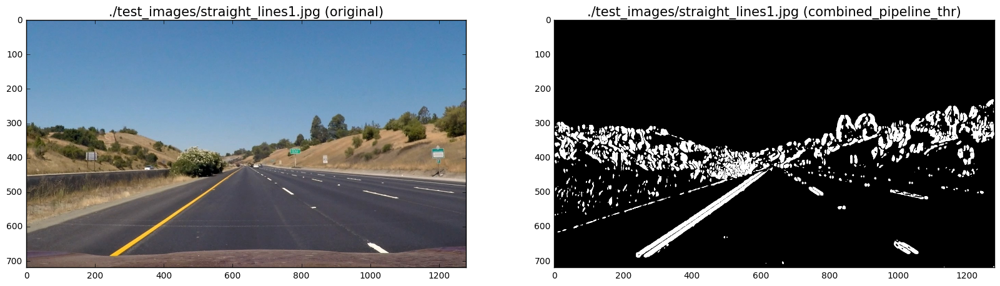

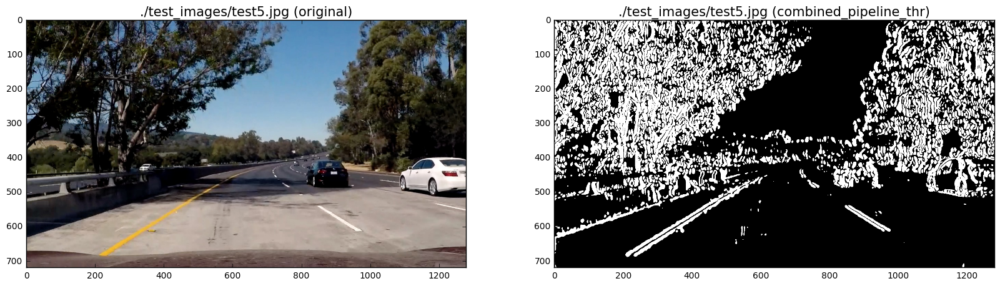

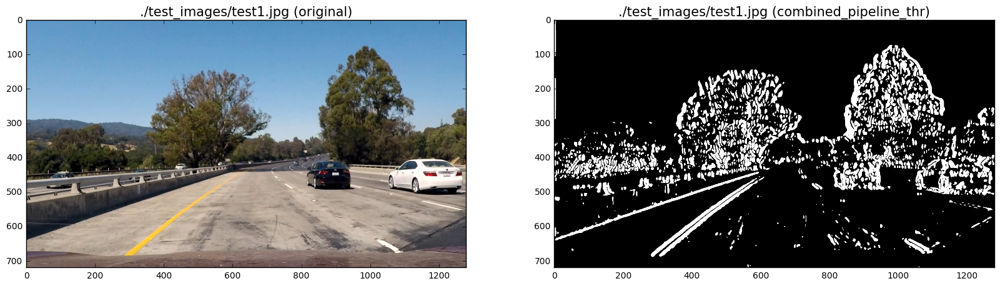

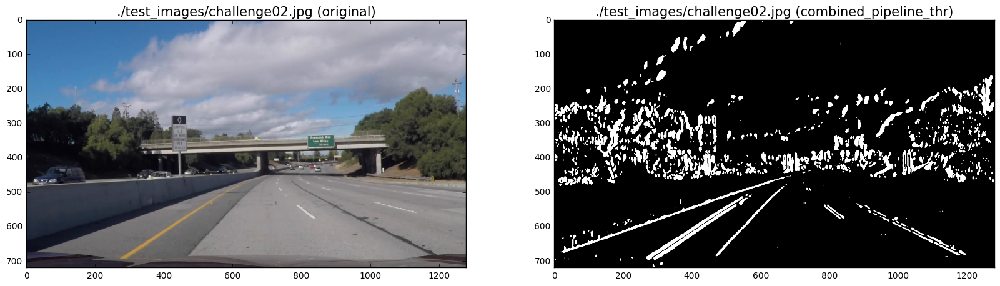

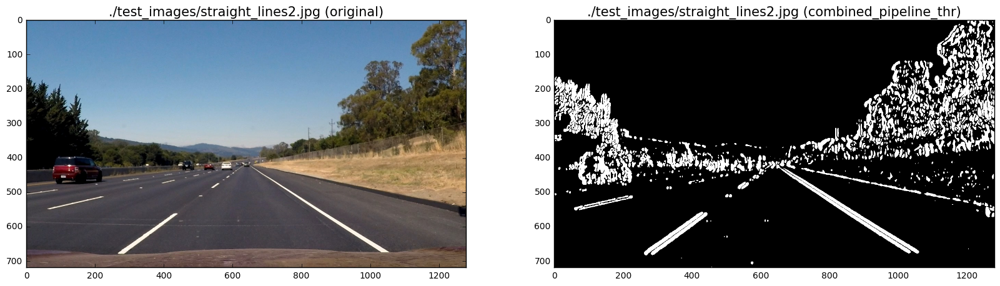

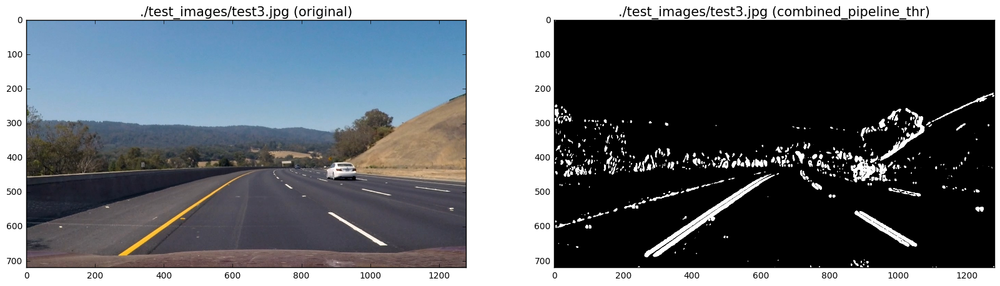

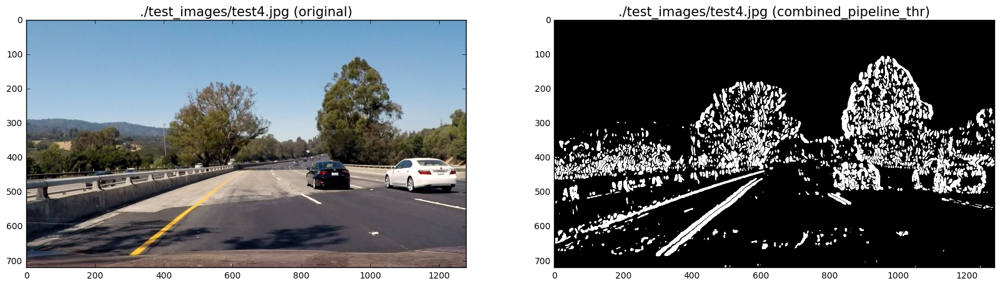

In [7]:
class segmentation():
    def __init__(self, config):
        """
        Params:
            ksize
                Kernel size for sobel filter.
                It should be a large odd number between [1 35] to smooth gradient measurements.
                
            sobel_thresh
                Threshold for normal sobel in x and y direction
                
            sobel_mag_thresh
                Threshold for magnitude sobel [sqrt(sobelx^2 + sobely^2)]
                
            sobel_dir_thresh
                Threshold for directional sobel filter in radians

            hls_s_thresh
                Threshold for S channel in HLS colourspace
        """
        self.set_config(config)
        
    def set_config(self, config):
        if "ksize" in config:
            self.ksize = config["ksize"]
        else:
            self.ksize = 31
        if "sobel_thresh" in config:
            self.sobel_thresh = config["sobel_thresh"]
        else:
            self.sobel_thresh = (0.11, 0.7)
        if "sobel_mag_thresh" in config:
            self.sobel_mag_thresh = config["sobel_mag_thresh"]
        else:
            self.sobel_mag_thresh = (0.11, 0.7)
        if "sobel_dir_thresh" in config:
            self.sobel_dir_thresh = config["sobel_dir_thresh"]
        else:
            self.sobel_dir_thresh = (np.pi/4, np.pi/2)
        if "hls_s_thresh" in config:
            self.hls_s_thresh = config["hls_s_thresh"]
        else:
            self.hls_s_thresh = (0.6, 1.0)


    def abs_sobel_thresh(self, image, orient='x'):
        if orient == 'x':
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        else:
            sobel = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel = sobel/np.max(sobel)
        grad_binary = np.zeros_like(sobel).astype(np.uint8)
        grad_binary[(sobel >= self.sobel_thresh[0]) & (sobel <= self.sobel_thresh[1])] = 1
        return grad_binary


    def mag_thresh(self, image):
        sobelx = self.abs_sobel_thresh(image, orient='x')
        sobely = self.abs_sobel_thresh(image, orient='y')
        sobel = np.sqrt(sobelx**2 + sobely**2)
        sobel /= np.max(sobel)
        mag_binary = np.zeros_like(sobel).astype(np.uint8)
        mag_binary[(sobel >= self.sobel_mag_thresh[0]) & (sobel <= self.sobel_mag_thresh[1])] = 1
        return mag_binary


    def dir_threshold(self, image):
        sobelx = np.abs(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=self.ksize))
        sobely = np.abs(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=self.ksize))
        sobel_angle = np.arctan2(sobely, sobelx)
        dir_binary = np.zeros_like(sobel_angle).astype(np.uint8)
        dir_binary[(sobel_angle >= thresh[0]) & (sobel_angle <= thresh[1])] = 1
        return dir_binary
    
    
    def run_pipeline(self, image):
        hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        H = hls[:,:,0] / np.max(hls[:,:,0])
        L = hls[:,:,1] / np.max(hls[:,:,1])
        S = hls[:,:,2] / np.max(hls[:,:,2])
        #S -= -S.mean(axis=(0,1))
        R = image[:,:,0] / np.max(image[:,:,0]) # Pick red channel from RGB image

        # Apply sobel thresholding in x direction for S and R channgel
        gradx_r = self.abs_sobel_thresh(R, orient='x')
        gradx_s = self.abs_sobel_thresh(S, orient='x')

        # Threshold color channel
        s_binary = np.zeros_like(S)
        s_binary[(S >= self.hls_s_thresh[0]) & (S <= self.hls_s_thresh[1])] = 1

        # Combine the two binary thresholds
        combined_binary = np.zeros_like(gradx_r).astype(np.uint8)
        combined_binary[(gradx_r == 1) | (gradx_s == 1)] = 1

        return combined_binary
    


segmentation_config = {
    "ksize" : 31,
    "sobel_thresh" : (0.11, 0.7),
    "sobel_mag_thresh" : (0.11, 0.7),
    "sobel_dir_thresh" : (np.pi/4, np.pi/2),
    "hls_s_thresh" : (0.6, 1.0)
}

segm = segmentation(segmentation_config)

for file in random.sample(test_files, 8):
    img = mpimg.imread(file)
    combined_pipeline = segm.run_pipeline(img)

    # Visualize images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title(file + " (original)", fontsize=15)
    ax2.imshow(combined_pipeline, cmap='gray')
    ax2.set_title(file + " (combined_pipeline_thr)", fontsize=15)
    plt.show()

## Unwarping images

In this section we essentially estimate the camera to road plane warping transformation.
We need to do this in order to project the camera angle into a birds-eye angle onto the road.

This first part will re-use old code from *P1 - find lane* project to detect straight lines, which will be used to find the *src* points for `cv2.getPerspectiveTransform` function. Only the images with straight lane lines will be used to find those parameters. The obtained warp transformation matrix will be used for all other images.

M:
[[   -0.5357    -1.4920   970.5817]
 [    0.0000    -1.8318   807.8294]
 [    0.0000    -0.0024     1.0000]]
Minv:
[[    0.0882    -0.8284   583.5294]
 [   -0.0000    -0.5459   441.0000]
 [   -0.0000    -0.0013     1.0000]]


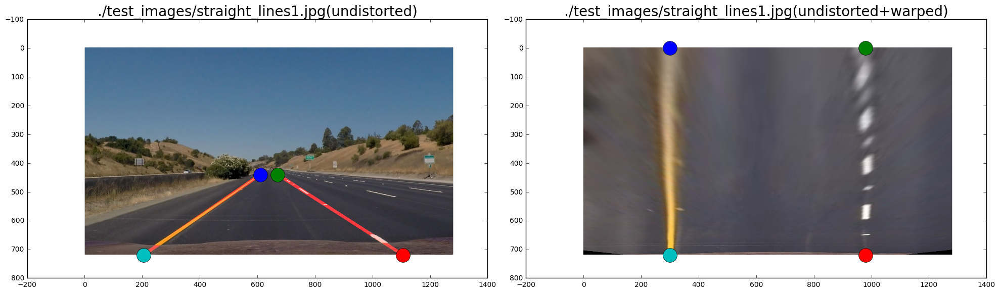

M:
[[   -0.5534    -1.4904   976.1446]
 [   -0.0000    -1.9080   852.8981]
 [   -0.0000    -0.0024     1.0000]]
Minv:
[[    0.1265    -0.8014   560.0588]
 [   -0.0000    -0.5241   447.0000]
 [   -0.0000    -0.0013     1.0000]]


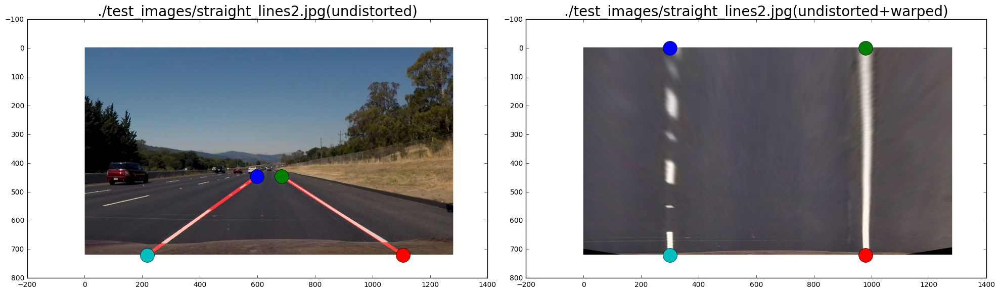

In [8]:
offset = 300 # distance from outer corners of undistorted image to the border in unwarped perspective

# Parameters for ROI selection
roi_height = 0.6
dist_from_side = 0.45 # realtive to image width, max. value: 0.5 -> triangle
ignore_mask_color = 255

straight_lines_files = glob.glob("./test_images/straight*.jpg")


for file in straight_lines_files:
    image = mpimg.imread(file)
    xsize, ysize = img_size = (image.shape[1], image.shape[0])
    
    undist = cv2.undistort(image, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    line_img = np.zeros(image.shape, dtype=np.uint8)
    lines2 = get_straight_lines(undist)
    draw_lines(line_img, lines2, color=[255, 0, 0], thickness=10)
    
    combined_img = weighted_img(line_img, image)

    left_x1,  left_y1,  left_x2,  left_y2  = lines2[0][0]
    right_x1, right_y1, right_x2, right_y2 = lines2[1][0]
    src = np.array([[left_x1,  left_y1],  [right_x1, right_y1],
                    [right_x2, right_y2], [left_x2,  left_y2]], dtype=np.float32)
    
    dst = np.array([[offset,        0],
                    [xsize-offset,  0], 
                    [xsize-offset,  ysize],
                    [offset,        ysize]], dtype=np.float32)

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    print("M:\n%s" % M)
    print("Minv:\n%s" % Minv)
    warped = cv2.warpPerspective(undist, M, (xsize, ysize), flags=cv2.INTER_LINEAR)
    
    # Visualize unwarped image next to the undistorted image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    ax1.imshow(combined_img)
    for coord in src:
        ax1.plot(coord[0], coord[1], 'o', markersize=20)
    ax1.set_title(file + "(undistorted)", fontsize=20)
    
    ax2.imshow(warped)
    for coord in dst:
        ax2.plot(coord[0], coord[1], 'o', markersize=20)
    ax2.set_title(file + "(undistorted+warped)", fontsize=20)

    plt.tight_layout()
    plt.show()

Mean [S]:  0.0590504025395  Max [S]:  1.0


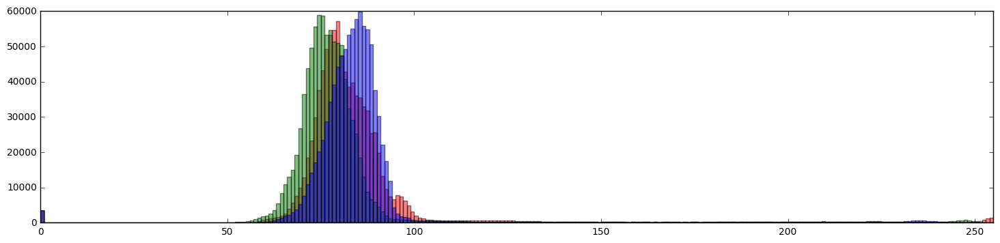

Means:  [   85.2435    80.3571    86.1604]


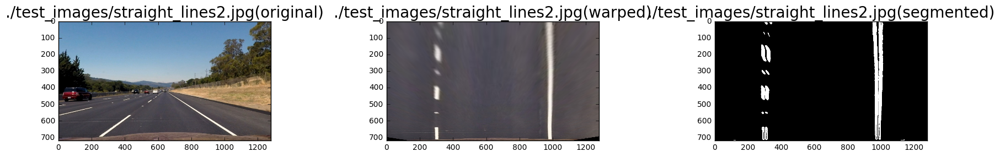

Mean [S]:  0.0744989404616  Max [S]:  1.0


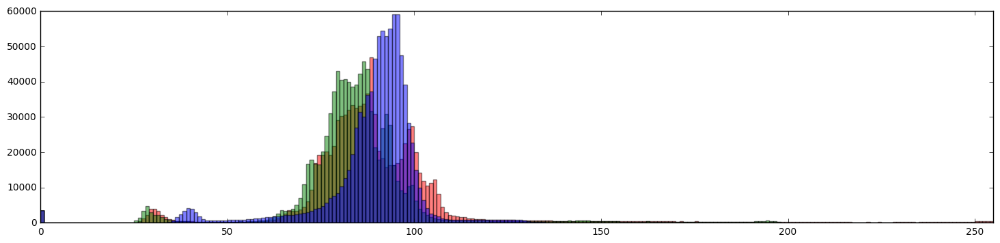

Means:  [   89.9983    84.7539    89.3544]


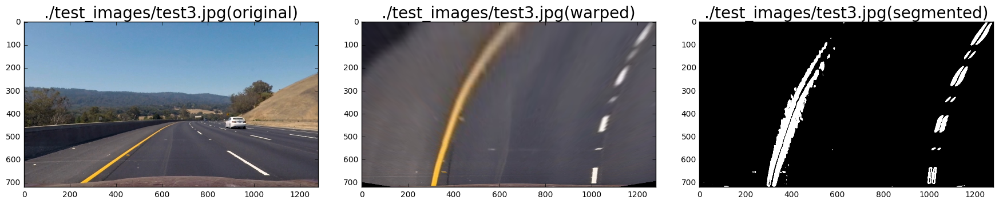

Mean [S]:  0.0666934274578  Max [S]:  1.0


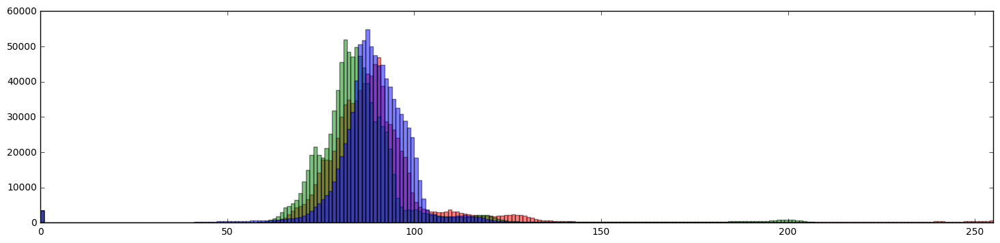

Means:  [   92.4393    86.8652    89.9221]


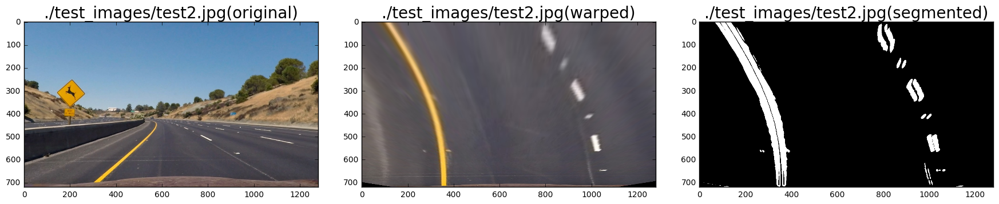

Mean [S]:  0.108262819211  Max [S]:  1.0


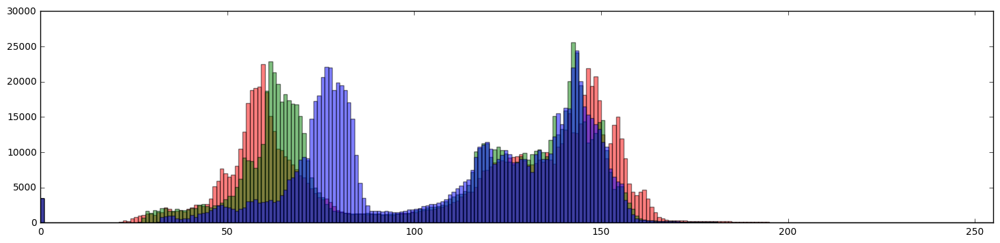

Means:  [  105.2937   104.0052   108.3577]


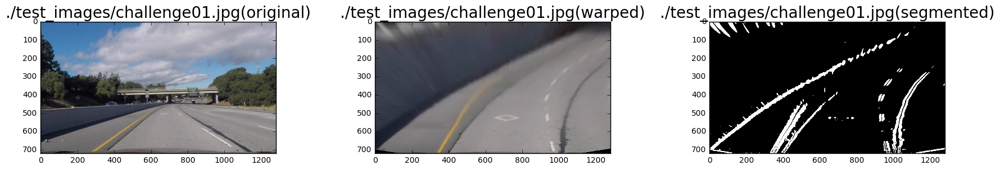

Mean [S]:  0.136150478787  Max [S]:  1.0


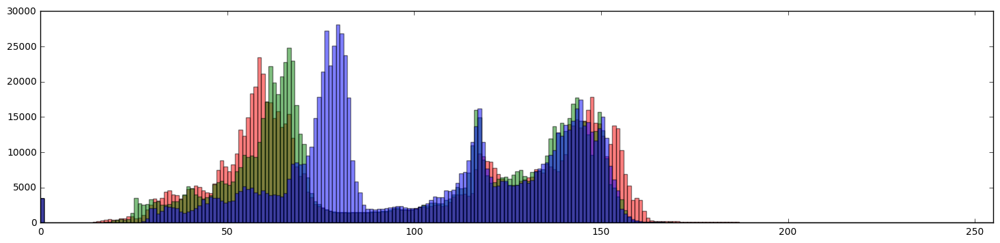

Means:  [   97.2634    96.1198   101.8047]


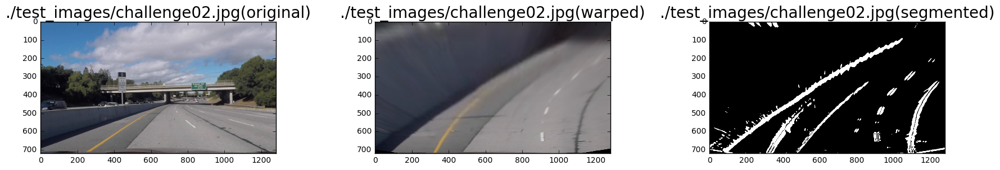

Mean [S]:  0.100102743394  Max [S]:  1.0


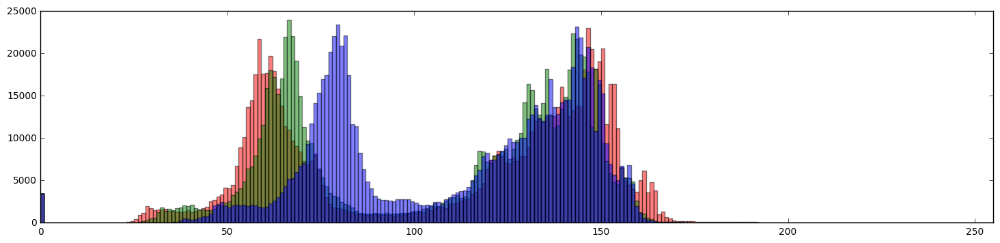

Means:  [  107.3193   106.0698   110.9770]


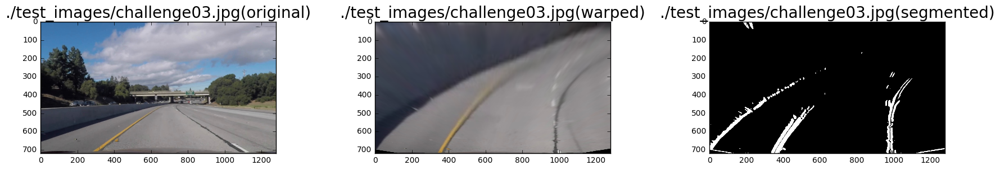

Mean [S]:  0.172249663841  Max [S]:  1.0


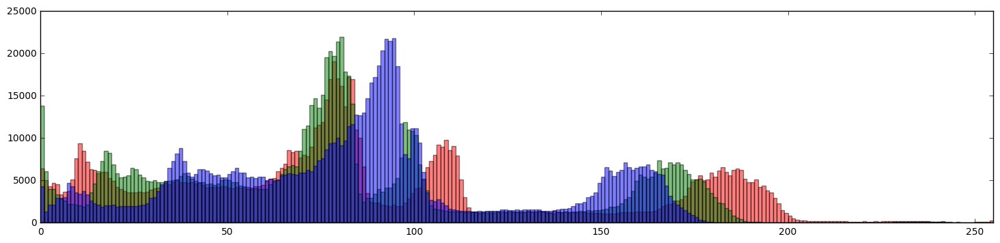

Means:  [   87.7453    82.5425    86.0710]


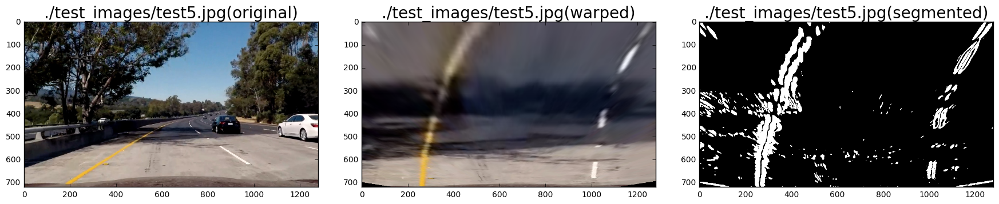

Mean [S]:  0.101680930011  Max [S]:  1.0


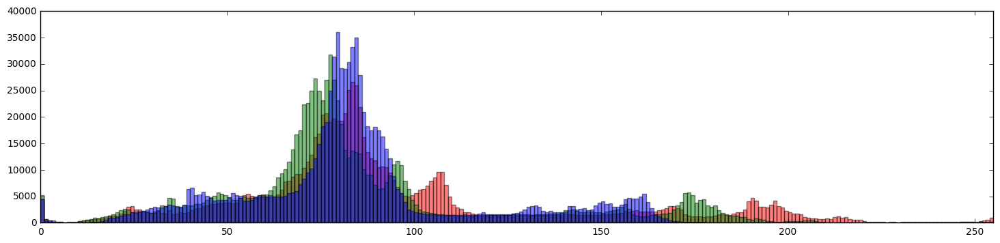

Means:  [   95.5147    86.7941    85.0589]


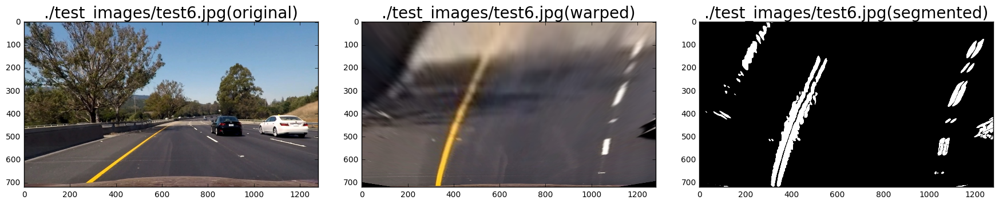

In [9]:
segmentation_config = {
    "ksize"              : 31,
    "sobel_thresh"       : (0.11, 0.7),
    "sobel_mag_thresh"   : (0.11, 0.7),
    "sobel_dir_thresh"   : (np.pi/4, np.pi/2),
    "hls_s_thresh"       : (0.6, 1.0)
}


segm = segmentation(segmentation_config)

for file in random.sample(test_files, 8):
    img = mpimg.imread(file)
    xsize, ysize = img_size = (image.shape[1], image.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2] / hls[:,:,2].max()
    s_mean = S.mean(axis=(0,1))
    print("Mean [S]: ", s_mean, " Max [S]: ", S.max(axis=(0,1)))
    segmented = segm.run_pipeline(warped)

    # Visualize unwarped image next to the undistorted image
    fig = plt.figure(figsize=(18,4))
    plt.hist(warped[:,:,0].ravel(), bins=256, range=[0,256], facecolor='r', alpha=0.5)
    plt.hist(warped[:,:,1].ravel(), bins=256, range=[0,256], facecolor='g', alpha=0.5)
    plt.hist(warped[:,:,2].ravel(), bins=256, range=[0,256], facecolor='b', alpha=0.5)
    plt.xlim([0,255])
    plt.show()

    print("Means: ", warped.mean(axis=(0,1)))
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,10))
    
    ax1.imshow(undist)
    ax1.set_title(file + "(original)", fontsize=20)
    
    ax2.imshow(warped, cmap='gray')
    ax2.set_title(file + "(warped)", fontsize=20)
    
    ax3.imshow(segmented, cmap='gray')
    ax3.set_title(file + "(segmented)", fontsize=20)

    plt.tight_layout()
    plt.show()

## Lane detection

Two approaches considered:
* Sliding window with convolutoin
* Histogram

Coefficients for left / right line:  [   -0.0004     0.1761   473.4442] [    0.0001    -0.4303  1236.1252]
Coefficient diffs left / right line:  [    0.0000     0.0000     0.0000] [    0.0000     0.0000     0.0000]


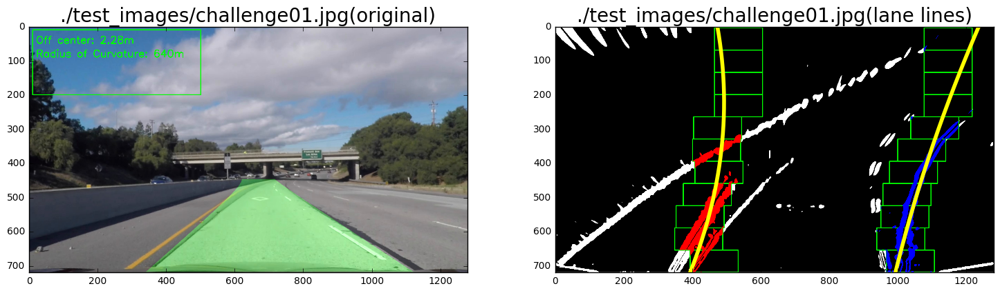

Coefficients for left / right line:  [   -0.0004     0.2211   409.8219] [    0.0006    -0.8643  1424.5691]
Coefficient diffs left / right line:  [    0.0000     0.0000     0.0000] [    0.0000     0.0000     0.0000]


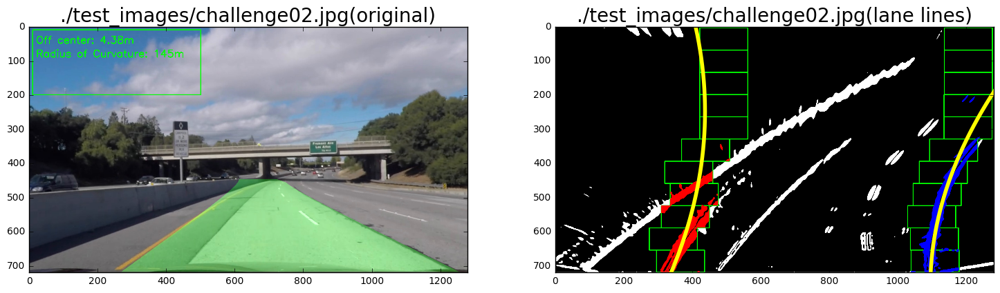

Coefficients for left / right line:  [   -0.0015     1.2893   211.9388] [    0.0005    -0.6184  1176.7687]
Coefficient diffs left / right line:  [    0.0000     0.0000     0.0000] [    0.0000     0.0000     0.0000]


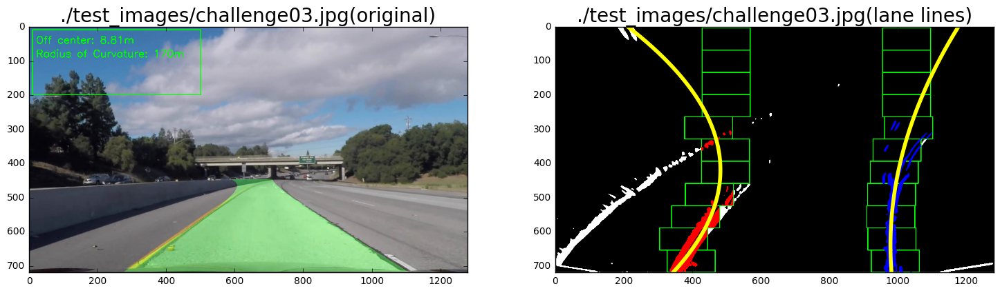

In [12]:
# A class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        #self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = 0 
        #distance in meters of vehicle center from the line
        self.line_base_pos = 0 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = []  
        #y values for detected line pixels
        self.ally = []

        
class lane_detection():
    def __init__(self, config):
        """
        Params:
            nr_windows
                number of sliding windows    

            margin
                width of the windows +/- margin

            minpix
                minimum number of pixels found to recenter window
        """
        self.set_config(config)
        self.left_line  = Line()
        self.right_line = Line()
        self.left_fit_buffer  = deque(maxlen=self.buffer_size)
        self.right_fit_buffer = deque(maxlen=self.buffer_size)
        self.left_xfitted_buffer = deque(maxlen=self.buffer_size)
        self.right_xfitted_buffer = deque(maxlen=self.buffer_size)


    def set_config(self, config):
        if "nr_windows" in config:
            self.nr_windows=config["nr_windows"]
        else:
            self.nr_windows=10

        if "margin" in config:
            self.margin=config["margin"]
        else:
            self.margin=100
        
        if "minpix" in config:
            self.minpix=config["minpix"]
        else:
            self.minpix=50
        if "buffer_size" in config:
            self.buffer_size=config["buffer_size"]
        else:
            self.buffer_size=50
        
        self.window_width = 100 
        
        # Define conversions in x and y from pixel space to meters
        self.ym_per_pix =  30 / 720 # meters per pixel in y dimension
        self.xm_per_pix = 3.7 / 700 # meters per pixel in x dimension
        


    def window_mask(self, width, height, img_ref, center, level):
        output = np.zeros_like(img_ref)
        interval_left  = int(img_ref.shape[0] - (level+1)*height)
        interval_right = int(img_ref.shape[0] - level*height)
        output[interval_left:interval_right, max(0, center-width//2):min(center+width//2, img_ref.shape[1])] = 1
        return output


    def find_window_centroids(self, image):
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        
        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(self.window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(image[int(3*image.shape[0]/4):,:int(image.shape[1]/2)], axis=0)
        l_center = int(np.argmax(np.convolve(window,l_sum))-self.window_width/2)
        r_sum = np.sum(image[int(3*image.shape[0]/4):,int(image.shape[1]/2):], axis=0)
        r_center = int(np.argmax(np.convolve(window,r_sum))-self.window_width/2+int(image.shape[1]/2))

        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(image.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            interval_left  = int(image.shape[0]-(level+1)*window_height)
            interval_right = int(image.shape[0]-level*window_height)
            image_layer = np.sum(image[interval_left:interval_right,:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use self.window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = self.window_width/2
            l_min_index = int(max(l_center+offset-self.margin,0))
            l_max_index = int(min(l_center+offset+self.margin,image.shape[1]))
            l_center    = int(np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset)
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-self.margin,0))
            r_max_index = int(min(r_center+offset+self.margin,image.shape[1]))
            r_center    = int(np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset)
            # Add what we found for that layer
            window_centroids.append((l_center, r_center))

        return window_centroids

    
    def out_image(self, image):
        window_centroids = self.find_window_centroids(image)
        window_height = image.shape[0] // self.nr_windows # Break image into 9 vertical layers since image height is 720
        # If we found any window centers
        if len(window_centroids) > 0:

            # Points used to draw all the left and right windows
            l_points = np.zeros_like(image)
            r_points = np.zeros_like(image)

            # Go through each level and draw the windows 
            for level in range(len(window_centroids)):
                # Window_mask is a function to draw window areas
                l_mask = self.window_mask(self.window_width, window_height, image, window_centroids[level][0], level)
                r_mask = self.window_mask(self.window_width, window_height, image, window_centroids[level][1], level)
                # Add graphic points from window mask here to total pixels found 
                l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
                r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

            # Draw the results
            template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
            zero_channel = np.zeros_like(template) # create a zero color channel
            template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
            warpage= np.dstack((image, image, image))*255 # making the original road pixels 3 color channels
            output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
        else:
            output = np.array(cv2.merge((warped, warped, warped)), np.uint8)

        return output


    def fit_lane_line(self, binary_warped, reuse_last_fit=False):
        xsize, ysize = img_size = (binary_warped.shape[1], binary_warped.shape[0])
        
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero  = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        ploty = np.linspace(0, ysize-1, ysize)
            
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255 
        
        # we can only reuse our last fit if there exists one!
        if reuse_last_fit and self.left_line.detected and self.right_line.detected:
            left_lane_inds  = ((nonzerox > (np.polyval(self.left_line.best_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.left_line.best_fit, nonzeroy) + self.margin)))

            right_lane_inds = ((nonzerox > (np.polyval(self.right_line.best_fit, nonzeroy) - self.margin)) &
                               (nonzerox < (np.polyval(self.right_line.best_fit, nonzeroy) + self.margin)))
        else:
            
            # Take a histogram of the bottom half of the image as a starting point to find the lanes
            histogram = np.sum(binary_warped[ysize//2:,:], axis=0)

            # Find the peak of the left and right halves of the histogram
            # These will be the starting point for the left and right lines
            midpoint    = histogram.shape[0] // 2
            leftx_base  = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint

            # Set height of windows
            window_height = ysize // self.nr_windows

            # Current positions to be updated for each window
            leftx_current  = leftx_base
            rightx_current = rightx_base

            # Create empty lists to receive left and right lane pixel indices
            left_lane_inds  = []
            right_lane_inds = []

            # Step through the windows one by one
            for window in range(self.nr_windows):
                # Identify window boundaries in x and y (and right and left)
                win_y_low  = ysize - (window+1)*window_height
                win_y_high = ysize - window*window_height
                win_xleft_low = leftx_current - self.margin
                win_xleft_high = leftx_current + self.margin
                win_xright_low = rightx_current - self.margin
                win_xright_high = rightx_current + self.margin
                # Draw the windows on the visualization image
                cv2.rectangle(out_img, (win_xleft_low,  win_y_low), (win_xleft_high,  win_y_high),  (0,255,0), 2) 
                cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high),  (0,255,0), 2) 
                # Identify the nonzero pixels in x and y within the window
                good_left_inds = ((nonzeroy >= win_y_low)       & (nonzeroy < win_y_high) & 
                                  (nonzerox >= win_xleft_low)   & (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low)      & (nonzeroy < win_y_high) & 
                                   (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
                # Append these indices to the lists
                left_lane_inds.append(good_left_inds)
                right_lane_inds.append(good_right_inds)
                # If you found > minpix pixels, recenter next window on their mean position
                if len(good_left_inds) > self.minpix:
                    leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
                if len(good_right_inds) > self.minpix:        
                    rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

            # Concatenate the arrays of indices
            left_lane_inds  = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)

        # Mark pixels in left and right line
        out_img[nonzeroy[left_lane_inds],  nonzerox[left_lane_inds]]  = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Extract detected left and right line pixel positions
        self.left_line.allx  = leftx   = nonzerox[left_lane_inds]
        self.right_line.allx = rightx  = nonzerox[right_lane_inds] 
        self.left_line.ally  = lefty   = nonzeroy[left_lane_inds]
        self.right_line.ally = righty  = nonzeroy[right_lane_inds] 
        
        # Fit a second order polynomial to each line
        self.left_line.current_fit  = np.polyfit(lefty, leftx, 2)
        self.right_line.current_fit = np.polyfit(righty, rightx, 2)

        # Fit new polynomials also to x,y in world space
        left_fit_cr  = np.polyfit(lefty*self.ym_per_pix,  leftx*self.xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*self.ym_per_pix, rightx*self.xm_per_pix, 2)

        # Generate x values for plotting
        left_xfit  = np.polyval(self.left_line.current_fit, ploty)
        right_xfit = np.polyval(self.right_line.current_fit, ploty)
        
        if reuse_last_fit:
            # Difference in fit coefficients between last and new fits
            if len(self.left_fit_buffer) > 0:
                self.left_line.diffs  = self.left_line.current_fit  - self.left_fit_buffer[-1]
                self.right_line.diffs = self.right_line.current_fit - self.right_fit_buffer[-1]

            # Add polynomial coefficients to ringbuffer
            self.left_fit_buffer.append(self.left_line.current_fit)
            self.right_fit_buffer.append(self.right_line.current_fit)

            # Moving average of polynomial coefficients over self.buffer_size iterations for robustness
            # polynomial coefficients averaged over the last n iterations
            self.left_line.best_fit  = np.average(self.left_fit_buffer, axis=0)
            self.right_line.best_fit = np.average(self.right_fit_buffer, axis=0)

            self.left_xfitted_buffer.append(left_xfit)
            self.right_xfitted_buffer.append(right_xfit)
            
            #average x values of the fitted line over the last n iterations
            self.left_line.bestx  = np.average(self.left_xfitted_buffer, axis=0)
            self.right_line.bestx = np.average(self.left_xfitted_buffer, axis=0)

            # Generate a polygon to illustrate the search window area
            # And recast the x and y points into usable format for cv2.fillPoly()
            left_line_window1 = np.array([np.transpose(np.vstack([left_xfit - self.margin, ploty]))])
            left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_xfit + self.margin, ploty])))])
            left_line_pts = np.hstack((left_line_window1, left_line_window2))
            right_line_window1 = np.array([np.transpose(np.vstack([right_xfit - self.margin, ploty]))])
            right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_xfit + self.margin, ploty])))])
            right_line_pts = np.hstack((right_line_window1, right_line_window2))

            # Draw the lane onto the warped blank image
            window_img = np.zeros_like(out_img).astype(np.uint8)
            cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
            cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
            out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        else:
            self.left_line.best_fit  = self.left_line.current_fit
            self.right_line.best_fit = self.right_line.current_fit
            self.left_line.bestx  = left_xfit
            self.right_line.bestx = right_xfit


        y_eval = ysize*0.75  # evaluate curvature in the bottom of the image, close to the car

        # Calculate radius of curvature of the lines in meters
        self.left_line.radius_of_curvature = ((1 + (2*left_fit_cr[0]*y_eval*self.ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        self.left_line.radius_of_curvature = ((1 + (2*right_fit_cr[0]*y_eval*self.ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        # was the line detected in the last iteration?
        # TODO: find criterium to set those flags...
        self.left_line.detected = True
        self.right_line.detected = True

        # Calculate distance between image center and lines in meters
        left_fitx_cr  = np.polyval(left_fit_cr,  [y_eval])
        right_fitx_cr = np.polyval(right_fit_cr, [y_eval])
        self.left_line.line_base_pos  = self.xm_per_pix * (xsize/2 - left_fitx_cr)
        self.right_line.line_base_pos = self.xm_per_pix * (xsize/2 - right_fitx_cr)
        
        return (self.left_line, self.right_line, out_img)


segmentation_config = {
    "ksize"              : 31,
    "sobel_thresh"       : (0.11, 0.7),
    "sobel_mag_thresh"   : (0.11, 0.7),
    "sobel_dir_thresh"   : (np.pi/4, np.pi/2),
    "hls_s_thresh"       : (0.7, 1.0)
}

lane_detection_config = {
    "nr_windows"     : 11,
    "margin"         : 70,
    "minpix"         : 50,
    "buffer_size"    : 50
}

test_files_lane_detection = glob.glob("./test_images/straight*.jpg")
test_files_challenge = glob.glob("./test_images/challenge*.jpg")
segm = segmentation(segmentation_config)
detect_lanes = lane_detection(lane_detection_config)

for file in test_files_challenge:
    img = mpimg.imread(file)
    xsize, ysize = img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = segm.run_pipeline(warped)
    left_line, right_line, out_img = detect_lanes.fit_lane_line(binary_warped)
    car_lane_offset = left_line.line_base_pos - right_line.line_base_pos 
    radius_of_curvature = np.average([left_line.radius_of_curvature, right_line.radius_of_curvature])
    
    print("Coefficients for left / right line:  ", left_line.current_fit, right_line.current_fit)
    print("Coefficient diffs left / right line: ", left_line.diffs, right_line.diffs)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, ysize-1, ysize)
    # Create an image to draw the lines on
    color_warp = np.zeros_like(warped).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.array(np.hstack((pts_left, pts_right)))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_(pts), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    cv2.rectangle(result_img, (10, 10), (500, 200), color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Off center: %.2fm" % car_lane_offset, (20,50), cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=1, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Radius of Curvature: %.0fm" % radius_of_curvature, (20,90), cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=1, color=(0,255,0), thickness=2)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,10))
    
    ax1.imshow(result_img)
    ax1.set_title(file + "(original)", fontsize=20)
    ax2.imshow(out_img)
    ax2.plot(left_line.bestx, ploty, color='yellow', linewidth=4)
    ax2.plot(right_line.bestx, ploty, color='yellow', linewidth=4)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    ax2.set_title(file + "(lane lines)", fontsize=20)
    
    plt.show()

## Test on videos

In [13]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


segmentation_config = {
    "ksize"              : 31,
    "sobel_thresh"       : (0.11, 0.7),
    "sobel_mag_thresh"   : (0.11, 0.7),
    "sobel_dir_thresh"   : (np.pi/4, np.pi/2),
    "hls_s_thresh"       : (0.6, 1.0)
}

lane_detection_config = {
    "nr_windows" : 11,
    "margin"     : 70,
    "minpix"     : 50
}

segm = segmentation(segmentation_config)
detect_lanes = lane_detection(lane_detection_config)

def process_image(img):
    xsize, ysize = img_size = (img.shape[1], img.shape[0])
    undist = cv2.undistort(img, dist_pickle["mtx"], dist_pickle["dist"], None, dist_pickle["mtx"])
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    binary_warped = segm.run_pipeline(warped)
    left_line, right_line, out_img = detect_lanes.fit_lane_line(binary_warped, reuse_last_fit=True)
    car_lane_offset = left_line.line_base_pos - right_line.line_base_pos 
    radius_of_curvature = np.average([left_line.radius_of_curvature, right_line.radius_of_curvature])

    # Generate x and y values for plotting
    ploty = np.linspace(0, ysize-1, ysize)

    # Create an image to draw the lines on
    color_warp = np.zeros_like(warped).astype(np.uint8)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left  = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.array(np.hstack((pts_left, pts_right)))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_(pts), (0,255,0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result_img = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    cv2.rectangle(result_img, (10, 10), (500, 200), color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Off center: %.2fm" % car_lane_offset, (20,50), cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=1, color=(0,255,0), thickness=2)
    cv2.putText(result_img, "Radius of Curvature: %.0fm" % radius_of_curvature, (20,90), cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=1, color=(0,255,0), thickness=2)
    return result_img


video_output_folder = "videos_output/"
#video = "project_video.mp4"
video = "./challenge_video.mp4"

if not os.path.exists(video_output_folder):
    os.makedirs(video_output_folder)
result_path = video_output_folder + video

if not os.path.isfile(video):
    print("Video %s doesn't exist!")
else:
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    clip1 = VideoFileClip(video).subclip(0,2)
    white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time white_clip.write_videofile(result_path, audio=False)

[MoviePy] >>>> Building video videos_output/./challenge_video.mp4
[MoviePy] Writing video videos_output/./challenge_video.mp4


100%|██████████| 60/60 [00:07<00:00,  7.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/./challenge_video.mp4 

CPU times: user 17.9 s, sys: 1.2 s, total: 19.2 s
Wall time: 8.16 s


In [14]:
HTML("""<video width="960" height="540" controls><source src="{0}"></video>""".format(result_path))